# Quickstart for TARDIS

Every simulation run requires [atomic data](io/configuration/components/atomic/atomic_data.rst) and a [configuration file](io/configuration/index.rst). 

## Atomic Data

We recommend using the [kurucz_cd23_chianti_H_He.h5](https://github.com/tardis-sn/tardis-regression-data/raw/main/atom_data/kurucz_cd23_chianti_H_He.h5) dataset.

In [1]:
from tardis.io.atom_data import download_atom_data

Iterations:          0/? [00:00<?, ?it/s]

Packets:             0/? [00:00<?, ?it/s]

In [2]:
download_atom_data('kurucz_cd23_chianti_H_He')

Atomic Data kurucz_cd23_chianti_H_He already exists in /home/runner/Downloads/tardis-data/kurucz_cd23_chianti_H_He.h5. Will not download - override with force_download=True.


You can also obtain a copy of the atomic data from the [tardis-regression-data](https://github.com/tardis-sn/tardis-regression-data/tree/main/atom_data) repository.

## Example Configuration File

The configuration file [tardis_example.yml](https://github.com/tardis-sn/tardis/tree/master/docs/tardis_example.yml) is used throughout this Quickstart.

In [3]:
!wget -q -nc https://raw.githubusercontent.com/tardis-sn/tardis/master/docs/tardis_example.yml

In [4]:
!cat tardis_example.yml

# Example YAML configuration for TARDIS
tardis_config_version: v1.0

supernova:
  luminosity_requested: 9.44 log_lsun
  time_explosion: 13 day

atom_data: kurucz_cd23_chianti_H_He.h5

model:
  structure:
    type: specific
    velocity:
      start: 1.1e4 km/s
      stop: 20000 km/s
      num: 20
    density:
      type: branch85_w7

  abundances:
    type: uniform
    O: 0.19
    Mg: 0.03
    Si: 0.52
    S: 0.19
    Ar: 0.04
    Ca: 0.03

plasma:
  disable_electron_scattering: no
  ionization: lte
  excitation: lte
  radiative_rates_type: dilute-blackbody
  line_interaction_type: macroatom

montecarlo:
  seed: 23111963
  no_of_packets: 4.0e+4
  iterations: 20
  nthreads: 1

  last_no_of_packets: 1.e+5
  no_of_virtual_packets: 10

  convergence_strategy:
    type: damped
    damping_constant: 1.0
    threshold: 0.05
    fraction: 0.8
    hold_iterations: 3
    t_inner:
      damping_constant: 0.5

spectrum:
  start: 500 angstrom
  stop: 20000 angstrom
  num: 10000


## Running the Simulation

To run the simulation, import the `run_tardis` function and create the `sim` object. 

In [5]:
from tardis import run_tardis

<div class="alert alert-info">

**Note:**

Get more information about the [progress bars](io/output/progress_bars.rst), [logging configuration](io/optional/tutorial_logging_configuration.ipynb), and [convergence plots](io/visualization/tutorial_convergence_plot.ipynb). 
    
</div>

In [6]:
sim = run_tardis("tardis_example.yml", 
                 virtual_packet_logging=True,
                 show_convergence_plots=True,
                 export_convergence_plots=True,
                 log_level="INFO") 

Tabs(height=350, sizing_mode='stretch_width')
    [0] HTML(str, height=300, styles={'overflow-y': 'auto', ...})
    [1] HTML(str, height=300, styles={'overflow-y': 'auto', ...})
    [2] HTML(str, height=300, styles={'overflow-y': 'auto', ...})
    [3] HTML(str, height=300, styles={'overflow-y': 'auto', ...})

    'data': [{'type': 'scatter', 'uid': '7e0eb20d-58cf-4b6d-9734-e19ceed295c9', …

    'data': [{'type': 'scatter', 'uid': '7e0eb20d-58cf-4b6d-9734-e19ceed295c9', …

## Plotting the Spectrum

Finally, plot the generated spectrum with `matplotlib`.

In [7]:
import matplotlib.pyplot as plt

In [8]:
spectrum = sim.spectrum_solver.spectrum_real_packets
spectrum_virtual = sim.spectrum_solver.spectrum_virtual_packets
spectrum_integrated = sim.spectrum_solver.spectrum_integrated

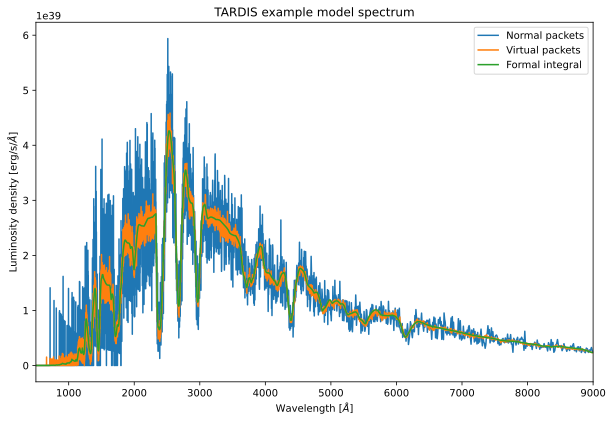

In [9]:
%matplotlib inline
plt.figure(figsize=(10, 6.5))

spectrum.plot(label="Normal packets")
spectrum_virtual.plot(label="Virtual packets")
spectrum_integrated.plot(label='Formal integral')

plt.xlim(500, 9000)
plt.title("TARDIS example model spectrum")
plt.xlabel("Wavelength [$\AA$]")
plt.ylabel("Luminosity density [erg/s/$\AA$]")
plt.legend()
plt.show()

In [10]:
sim.convergence_plots.plasma_plot.show(renderer="notebook_connected")

FigureWidget({
    'data': [{'type': 'scatter', 'uid': '7e0eb20d-58cf-4b6d-9734-e19ceed295c9', 'xaxis': 'x', 'yaxis': 'y'},
             {'type': 'scatter', 'uid': '398f95f9-a9c2-42e1-9bb7-858a8e06df13', 'xaxis': 'x2', 'yaxis': 'y2'},
             {'customdata': [<br>Emitted Luminosity: 7.942e+42<br>Requested
                             Luminosity: 1.059e+43<br>Absorbed Luminosity:
                             2.659e+42, <br>Emitted Luminosity:
                             7.942e+42<br>Requested Luminosity:
                             1.059e+43<br>Absorbed Luminosity: 2.659e+42,
                             <br>Emitted Luminosity: 7.942e+42<br>Requested
                             Luminosity: 1.059e+43<br>Absorbed Luminosity:
                             2.659e+42, <br>Emitted Luminosity:
                             7.942e+42<br>Requested Luminosity:
                             1.059e+43<br>Absorbed Luminosity: 2.659e+42,
                             <br>Emitted Luminosity: 7.942e

In [11]:
sim.convergence_plots.t_inner_luminosities_plot.show(renderer="notebook_connected")

FigureWidget({
    'data': [{'hovertemplate': '<b>%{y:.3f}</b> at X = %{x:,.0f}<extra>Inner Boundary Temperature</extra>',
              'hovertext': 'text',
              'mode': 'lines',
              'name': 'Inner<br>Boundary<br>Temperature',
              'type': 'scatter',
              'uid': '575fa178-c2fc-4605-afd1-e69d3e1ac13d',
              'x': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
                    19, 20],
              'xaxis': 'x',
              'y': [9933.951995919648, 10703.326690661204, 10673.70899787496,
                    10637.547540479592, 10641.159129678084, 10647.21792187558,
                    10645.645143673266, 10644.006890853354, 10636.774698387824,
                    10653.396242694302, 10624.87671149729, 10649.270706438705,
                    10653.80173531274, 10646.745959706495, 10641.332585091845,
                    10652.280791386343, 10654.516238187465, 10637.79337258581,
                    10638.424342954939, 10651